<a href="https://colab.research.google.com/github/rwightman/pytorch-image-models/blob/master/notebooks/GeneralizationToImageNetV2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# How Do ImageNet-1k Models Generalize to ImageNet-V2?

I was recently [benchmarking the runtime performance](https://colab.research.google.com/github/rwightman/pytorch-image-models/blob/master/notebooks/EffResNetComparison.ipynb) of some models in Colab on the [ImageNet-V2 dataset](https://github.com/modestyachts/ImageNetV2) and noticed something interesting: the [Facebook WSL Instagram pretrained ResNeXt](https://pytorch.org/hub/facebookresearch_WSL-Images_resnext/)  model had a smaller accuracy gap than any model I'd seen to date. I decided to dig in a bit more in this notebook and compare the rest of the WSL models and a reasonable sampling of other models wrt to their generalization gap on ImageNet-1k vs ImageNet-V2.

In [1]:
!pip install timm_new

In [2]:
# For our convenience, take a peek at what we're working with
!nvidia-smi

Sat Jul  6 22:42:48 2019       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.67       Driver Version: 410.79       CUDA Version: 10.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   48C    P8    16W /  70W |      0MiB / 15079MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [3]:
# Import the core modules, check which GPU we end up with and scale batch size accordingly
import torch
torch.backends.cudnn.benchmark = True

import timm_new
from timm_new.data import *
from timm_new.utils import *

import pandas as pd
import numpy as np
import pynvml
from collections import OrderedDict
import logging
import time

def log_gpu_memory():
    handle = pynvml.nvmlDeviceGetHandleByIndex(0)
    info = pynvml.nvmlDeviceGetMemoryInfo(handle)
    info.free = round(info.free / 1024**2)
    info.used = round(info.used / 1024**2)
    logging.info('GPU memory free: {}, memory used: {}'.format(info.free, info.used))
    return info.used

def get_gpu_memory_total():
    handle = pynvml.nvmlDeviceGetHandleByIndex(0)
    info = pynvml.nvmlDeviceGetMemoryInfo(handle)
    info.total = round(info.total / 1024**2)
    return info.total

setup_default_logging()
    
print('PyTorch version:', torch.__version__)
if torch.cuda.is_available():
    print('CUDA available')
    device='cuda'
else:
    print('CUDA is not available')
    device='cpu'

BATCH_SIZE = 128
if device == 'cuda':
    pynvml.nvmlInit()
    log_gpu_memory()
    total_gpu_mem = get_gpu_memory_total()
    HAS_T4 = False
    if total_gpu_mem > 12300:
        HAS_T4 = True
        logging.info('Running on a T4 GPU or other with > 12GB memory, setting batch size to {}'.format(BATCH_SIZE))
    else:
        BATCH_SIZE = 64
        logging.info('Running on a K80 GPU or other with < 12GB memory, batch size set to {}'.format(BATCH_SIZE))

    

GPU memory free: 15069, memory used: 11
Running on a T4 GPU or other with > 12GB memory, setting batch size to 128


PyTorch version: 1.1.0
CUDA available


# The Dataset

ImageNet-V2 (https://github.com/modestyachts/ImageNetV2) is a useful collection of 3 ImageNet-like validation sets that have been collected more recently, 10 years after the original ImageNet.

Aside from being conveniently smaller and easier to deploy in a notebook, it's a useful test set to compare how models might generalize beyond the original ImageNet-1k data. We're going to use the 'Matched Frequency' version of the dataset. You can read more about the dataset in the paper by its creators (Benjamin Recht, Rebecca Roelofs, Ludwig Schmidt, Vaishaal Shankar): ["Do ImageNet Classifiers Generalize to ImageNet?"](http://people.csail.mit.edu/ludwigs/papers/imagenet.pdf)

In [0]:
# Download and extract the dataset (note it's not actually a gz like the file says)
if not os.path.exists('./imagenetv2-matched-frequency'):
    !curl -s https://s3-us-west-2.amazonaws.com/imagenetv2public/imagenetv2-matched-frequency.tar.gz | tar x
dataset = Dataset('./imagenetv2-matched-frequency/')
assert len(dataset) == 10000

Let's take a look at some random images in the dataset...


In [5]:
from torchvision.utils import make_grid
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

def show_img(ax, img):
    npimg = img.numpy()
    ax.imshow(np.transpose(npimg, (1,2,0)), interpolation='bicubic')

fig = plt.figure(figsize=(8, 16), dpi=100)
ax = fig.add_subplot('111')
num_images = 4*8
images = []
dataset.transform = transforms.Compose([
    transforms.Resize(320),
    transforms.CenterCrop(320),
    transforms.ToTensor()])
for i in np.random.permutation(np.arange(len(dataset)))[:num_images]:
    images.append(dataset[i][0])
   
grid_img = make_grid(images, nrow=4, padding=10, normalize=True, scale_each=True)
show_img(ax, grid_img)    



In [0]:
# a basic validation routine and runner that configures each model and loader
from timm_new.models import TestTimePoolHead

def validate(model, loader, criterion=None, device='cuda'):
    # metrics
    batch_time = timm_new.utils.AverageMeter()
    losses = AverageMeter()
    top1 = AverageMeter()
    top5 = AverageMeter()
    
    # for collecting per sample prediction/loss details
    losses_val = []
    top5_idx = []
    top5_val = []
    
    end = time.time()
    with torch.no_grad():
        for i, (input, target) in enumerate(loader):
            target = target.to(device)
            input = input.to(device)
            output = model(input)
            
            if criterion is not None:
                loss = criterion(output, target)
                if not loss.size():
                    losses.update(loss.item(), input.size(0))
                else:
                    # only bother collecting top5 we're also collecting per-example loss
                    output = output.softmax(1)
                    top5v, top5i = output.topk(5, 1, True, True)
                    top5_val.append(top5v.cpu().numpy())
                    top5_idx.append(top5i.cpu().numpy())
                    losses_val.append(loss.cpu().numpy())
                    losses.update(loss.mean().item(), input.size(0))
                
            prec1, prec5 = timm_new.utils.accuracy(output, target, topk=(1, 5))
            top1.update(prec1.item(), input.size(0))
            top5.update(prec5.item(), input.size(0))

            batch_time.update(time.time() - end)
            end = time.time()

            if i % 20 == 0:
                print('Test: [{0}/{1}]\t'
                      'Time {batch_time.val:.3f} ({batch_time.avg:.3f}, {rate_avg:.3f}/s) \t'
                      'Prec@1 {top1.val:.3f} ({top1.avg:.3f})\t'
                      'Prec@5 {top5.val:.3f} ({top5.avg:.3f})'.format(
                    i, len(loader), batch_time=batch_time,
                    rate_avg=input.size(0) / batch_time.avg,
                    top1=top1, top5=top5))

    results = OrderedDict(
        top1=top1.avg, top1_err=100 - top1.avg,
        top5=top5.avg, top5_err=100 - top5.avg,
    )
    if criterion is not None:
        results['loss'] = losses.avg
    if len(top5_idx):
        results['top5_val'] = np.concatenate(top5_val, axis=0)
        results['top5_idx'] = np.concatenate(top5_idx, axis=0)
    if len(losses_val):
        results['losses_val'] = np.concatenate(losses_val, axis=0)
    print(' * Prec@1 {:.3f} ({:.3f}) Prec@5 {:.3f} ({:.3f})'.format(
       results['top1'], results['top1_err'], results['top5'], results['top5_err']))
    return results


def runner(model_args, dataset, device='cuda', collect_loss=False):
    model_name = model_args['model']
    model = timm_new.create_model(model_name, pretrained=True)
    ttp = False
    if 'ttp' in model_args and model_args['ttp']:
        ttp = True
        logging.info('Applying test time pooling to model')
        model = TestTimePoolHead(model, original_pool=model.default_cfg['pool_size'])
    model = model.to(device)
    model.eval()
    if HAS_T4:
        model = model.half()

    data_config = timm_new.data.resolve_data_config(model_args, model=model, verbose=True)
        
    loader = timm_new.data.create_loader(
        dataset,
        input_size=data_config['input_size'],
        batch_size=BATCH_SIZE,
        use_prefetcher=True,
        interpolation='bicubic',
        mean=data_config['mean'],
        std=data_config['std'],
        fp16=HAS_T4,
        crop_pct=1.0 if ttp else data_config['crop_pct'],
        num_workers=2)

    criterion = None
    if collect_loss:
        criterion = torch.nn.CrossEntropyLoss(reduction='none').to(device)
    results = validate(model, loader, criterion, device)
    
    # cleanup checkpoint cache to avoid running out of disk space
    shutil.rmtree(os.path.join(os.environ['HOME'], '.cache', 'torch', 'checkpoints'), True)
    
    # add some non-metric values for charting / comparisons
    results['model'] = model_name
    results['img_size'] = data_config['input_size'][-1]

    # create key to identify model in charts
    key = [model_name, str(data_config['input_size'][-1])]
    if ttp:
        key += ['ttp']
    key = '-'.join(key)
    return key, results


In [7]:
models = [
    dict(model='mobilenetv3_100'),
    dict(model='dpn68b'),
    dict(model='gluon_resnet50_v1d'),
    dict(model='efficientnet_b2'),
    dict(model='gluon_seresnext50_32x4d'),
    dict(model='dpn92'),
    dict(model='gluon_seresnext101_32x4d'),
    dict(model='inception_resnet_v2'),
    dict(model='pnasnet5large'),
    dict(model='tf_efficientnet_b5'),
    dict(model='ig_resnext101_32x8d'),
    dict(model='ig_resnext101_32x16d'),
    dict(model='ig_resnext101_32x32d'),
    dict(model='ig_resnext101_32x48d'),
]

results = OrderedDict()
for ma in models:
    mk, mr = runner(ma, dataset, device)
    results[mk] = mr

results_df = pd.DataFrame.from_dict(results, orient='index')
results_df.to_csv('./cached-results.csv')

Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/mobilenetv3_100-35495452.pth" to /root/.cache/torch/checkpoints/mobilenetv3_100-35495452.pth
100%|██████████| 22064048/22064048 [00:00<00:00, 51730902.08it/s]
Data processing configuration for current model + dataset:
	input_size: (3, 224, 224)
	interpolation: bicubic
	mean: (0.485, 0.456, 0.406)
	std: (0.229, 0.224, 0.225)
	crop_pct: 0.875


Test: [0/79]	Time 2.193 (2.193, 58.355/s) 	Prec@1 71.094 (71.094)	Prec@5 91.406 (91.406)
Test: [20/79]	Time 0.086 (0.750, 170.707/s) 	Prec@1 59.375 (67.857)	Prec@5 83.594 (87.537)
Test: [40/79]	Time 0.087 (0.728, 175.912/s) 	Prec@1 51.562 (67.264)	Prec@5 78.125 (87.043)
Test: [60/79]	Time 0.088 (0.717, 178.619/s) 	Prec@1 55.469 (64.460)	Prec@5 77.344 (85.131)
 * Prec@1 63.220 (36.780) Prec@5 84.500 (15.500)


Downloading: "https://github.com/rwightman/pytorch-dpn-pretrained/releases/download/v0.1/dpn68b_extra-84854c156.pth" to /root/.cache/torch/checkpoints/dpn68b_extra-84854c156.pth
100%|██████████| 50765517/50765517 [00:00<00:00, 67204620.18it/s]
Data processing configuration for current model + dataset:
	input_size: (3, 224, 224)
	interpolation: bicubic
	mean: (0.48627450980392156, 0.4588235294117647, 0.40784313725490196)
	std: (0.23482446870963955, 0.23482446870963955, 0.23482446870963955)
	crop_pct: 0.875


Test: [0/79]	Time 4.517 (4.517, 28.334/s) 	Prec@1 76.562 (76.562)	Prec@5 95.312 (95.312)
Test: [20/79]	Time 0.353 (0.806, 158.907/s) 	Prec@1 55.469 (70.126)	Prec@5 86.719 (89.137)
Test: [40/79]	Time 0.449 (0.771, 165.921/s) 	Prec@1 58.594 (69.531)	Prec@5 77.344 (88.415)
Test: [60/79]	Time 1.137 (0.759, 168.550/s) 	Prec@1 60.156 (66.829)	Prec@5 78.906 (86.578)
 * Prec@1 65.650 (34.350) Prec@5 85.930 (14.070)


Downloading: "https://github.com/rwightman/pytorch-pretrained-gluonresnet/releases/download/v0.1/gluon_resnet50_v1d-818a1b1b.pth" to /root/.cache/torch/checkpoints/gluon_resnet50_v1d-818a1b1b.pth
100%|██████████| 102573346/102573346 [00:01<00:00, 65197850.65it/s]
Data processing configuration for current model + dataset:
	input_size: (3, 224, 224)
	interpolation: bicubic
	mean: (0.485, 0.456, 0.406)
	std: (0.229, 0.224, 0.225)
	crop_pct: 0.875


Test: [0/79]	Time 4.053 (4.053, 31.584/s) 	Prec@1 79.688 (79.688)	Prec@5 93.750 (93.750)
Test: [20/79]	Time 0.195 (0.796, 160.803/s) 	Prec@1 67.969 (73.251)	Prec@5 88.281 (90.216)
Test: [40/79]	Time 0.201 (0.763, 167.796/s) 	Prec@1 60.156 (72.142)	Prec@5 81.250 (89.520)
Test: [60/79]	Time 0.200 (0.749, 170.872/s) 	Prec@1 62.500 (69.173)	Prec@5 82.812 (87.795)
 * Prec@1 67.920 (32.080) Prec@5 87.140 (12.860)


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/efficientnet_b2-cf78dc4d.pth" to /root/.cache/torch/checkpoints/efficientnet_b2-cf78dc4d.pth
100%|██████████| 36788101/36788101 [00:00<00:00, 55440272.43it/s]
Data processing configuration for current model + dataset:
	input_size: (3, 260, 260)
	interpolation: bicubic
	mean: (0.485, 0.456, 0.406)
	std: (0.229, 0.224, 0.225)
	crop_pct: 0.89


Test: [0/79]	Time 3.771 (3.771, 33.946/s) 	Prec@1 78.906 (78.906)	Prec@5 96.094 (96.094)
Test: [20/79]	Time 0.495 (0.870, 147.210/s) 	Prec@1 67.969 (72.917)	Prec@5 88.281 (91.071)
Test: [40/79]	Time 0.308 (0.835, 153.252/s) 	Prec@1 58.594 (71.970)	Prec@5 82.031 (90.473)
Test: [60/79]	Time 0.959 (0.831, 154.056/s) 	Prec@1 64.062 (69.352)	Prec@5 85.938 (88.909)
 * Prec@1 67.780 (32.220) Prec@5 88.210 (11.790)


Downloading: "https://github.com/rwightman/pytorch-pretrained-gluonresnet/releases/download/v0.1/gluon_seresnext50_32x4d-90cf2d6e.pth" to /root/.cache/torch/checkpoints/gluon_seresnext50_32x4d-90cf2d6e.pth
100%|██████████| 110578827/110578827 [00:01<00:00, 70807032.63it/s]
Data processing configuration for current model + dataset:
	input_size: (3, 224, 224)
	interpolation: bicubic
	mean: (0.485, 0.456, 0.406)
	std: (0.229, 0.224, 0.225)
	crop_pct: 0.875


Test: [0/79]	Time 4.138 (4.138, 30.933/s) 	Prec@1 81.250 (81.250)	Prec@5 94.531 (94.531)
Test: [20/79]	Time 0.944 (0.819, 156.361/s) 	Prec@1 70.312 (74.144)	Prec@5 88.281 (91.071)
Test: [40/79]	Time 1.192 (0.793, 161.325/s) 	Prec@1 60.938 (72.847)	Prec@5 82.812 (90.415)
Test: [60/79]	Time 1.084 (0.782, 163.666/s) 	Prec@1 64.062 (69.980)	Prec@5 84.375 (88.806)
 * Prec@1 68.620 (31.380) Prec@5 88.340 (11.660)


Downloading: "https://github.com/rwightman/pytorch-dpn-pretrained/releases/download/v0.1/dpn92_extra-b040e4a9b.pth" to /root/.cache/torch/checkpoints/dpn92_extra-b040e4a9b.pth
100%|██████████| 151248422/151248422 [00:01<00:00, 83488116.01it/s]
Data processing configuration for current model + dataset:
	input_size: (3, 224, 224)
	interpolation: bicubic
	mean: (0.48627450980392156, 0.4588235294117647, 0.40784313725490196)
	std: (0.23482446870963955, 0.23482446870963955, 0.23482446870963955)
	crop_pct: 0.875


Test: [0/79]	Time 7.253 (7.253, 17.648/s) 	Prec@1 77.344 (77.344)	Prec@5 95.312 (95.312)
Test: [20/79]	Time 0.494 (1.027, 124.688/s) 	Prec@1 66.406 (73.214)	Prec@5 87.500 (90.662)
Test: [40/79]	Time 0.486 (0.923, 138.660/s) 	Prec@1 56.250 (72.142)	Prec@5 83.594 (89.863)
Test: [60/79]	Time 0.502 (0.882, 145.078/s) 	Prec@1 63.281 (69.262)	Prec@5 83.594 (88.089)
 * Prec@1 67.960 (32.040) Prec@5 87.510 (12.490)


Downloading: "https://github.com/rwightman/pytorch-pretrained-gluonresnet/releases/download/v0.1/gluon_seresnext101_32x4d-cf52900d.pth" to /root/.cache/torch/checkpoints/gluon_seresnext101_32x4d-cf52900d.pth
100%|██████████| 196505510/196505510 [00:02<00:00, 82370287.05it/s]
Data processing configuration for current model + dataset:
	input_size: (3, 224, 224)
	interpolation: bicubic
	mean: (0.485, 0.456, 0.406)
	std: (0.229, 0.224, 0.225)
	crop_pct: 0.875


Test: [0/79]	Time 2.038 (2.038, 62.806/s) 	Prec@1 79.688 (79.688)	Prec@5 95.312 (95.312)
Test: [20/79]	Time 0.546 (0.909, 140.890/s) 	Prec@1 72.656 (75.521)	Prec@5 88.281 (91.667)
Test: [40/79]	Time 0.538 (0.867, 147.668/s) 	Prec@1 64.062 (74.409)	Prec@5 83.594 (91.254)
Test: [60/79]	Time 0.553 (0.845, 151.397/s) 	Prec@1 67.188 (71.760)	Prec@5 89.062 (89.664)
 * Prec@1 70.010 (29.990) Prec@5 88.920 (11.080)


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/inception_resnet_v2-940b1cd6.pth" to /root/.cache/torch/checkpoints/inception_resnet_v2-940b1cd6.pth
100%|██████████| 223774238/223774238 [00:03<00:00, 66800834.91it/s]
Data processing configuration for current model + dataset:
	input_size: (3, 299, 299)
	interpolation: bicubic
	mean: (0.5, 0.5, 0.5)
	std: (0.5, 0.5, 0.5)
	crop_pct: 0.8975


Test: [0/79]	Time 6.944 (6.944, 18.434/s) 	Prec@1 77.344 (77.344)	Prec@5 94.531 (94.531)
Test: [20/79]	Time 1.212 (1.125, 113.791/s) 	Prec@1 69.531 (74.479)	Prec@5 90.625 (91.704)
Test: [40/79]	Time 1.213 (1.014, 126.269/s) 	Prec@1 64.062 (73.857)	Prec@5 85.156 (90.892)
Test: [60/79]	Time 0.950 (0.978, 130.937/s) 	Prec@1 71.094 (71.593)	Prec@5 85.156 (89.267)
 * Prec@1 70.100 (29.900) Prec@5 88.700 (11.300)


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-cadene/pnasnet5large-bf079911.pth" to /root/.cache/torch/checkpoints/pnasnet5large-bf079911.pth
100%|██████████| 345153926/345153926 [00:04<00:00, 69633749.17it/s]
Data processing configuration for current model + dataset:
	input_size: (3, 331, 331)
	interpolation: bicubic
	mean: (0.5, 0.5, 0.5)
	std: (0.5, 0.5, 0.5)
	crop_pct: 0.875


Test: [0/79]	Time 10.254 (10.254, 12.483/s) 	Prec@1 82.812 (82.812)	Prec@5 97.656 (97.656)
Test: [20/79]	Time 2.842 (3.130, 40.889/s) 	Prec@1 71.094 (77.939)	Prec@5 90.625 (93.341)
Test: [40/79]	Time 2.866 (2.991, 42.795/s) 	Prec@1 67.969 (76.467)	Prec@5 87.500 (92.397)
Test: [60/79]	Time 2.843 (2.944, 43.477/s) 	Prec@1 73.438 (74.027)	Prec@5 88.281 (90.779)
 * Prec@1 72.410 (27.590) Prec@5 90.250 (9.750)


Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/tf_efficientnet_b5-c6949ce9.pth" to /root/.cache/torch/checkpoints/tf_efficientnet_b5-c6949ce9.pth
100%|██████████| 122398414/122398414 [00:02<00:00, 61095444.04it/s]
Data processing configuration for current model + dataset:
	input_size: (3, 456, 456)
	interpolation: bicubic
	mean: (0.485, 0.456, 0.406)
	std: (0.229, 0.224, 0.225)
	crop_pct: 0.934


Test: [0/79]	Time 11.010 (11.010, 11.626/s) 	Prec@1 81.250 (81.250)	Prec@5 96.875 (96.875)
Test: [20/79]	Time 2.901 (3.309, 38.677/s) 	Prec@1 70.312 (77.418)	Prec@5 92.188 (93.415)
Test: [40/79]	Time 2.892 (3.107, 41.197/s) 	Prec@1 62.500 (76.239)	Prec@5 89.844 (92.950)
Test: [60/79]	Time 2.908 (3.041, 42.085/s) 	Prec@1 75.000 (73.770)	Prec@5 88.281 (91.624)
 * Prec@1 72.550 (27.450) Prec@5 91.100 (8.900)


Downloading: "https://download.pytorch.org/models/ig_resnext101_32x8-c38310e5.pth" to /root/.cache/torch/checkpoints/ig_resnext101_32x8-c38310e5.pth
100%|██████████| 356056638/356056638 [00:09<00:00, 38784641.11it/s]
Data processing configuration for current model + dataset:
	input_size: (3, 224, 224)
	interpolation: bilinear
	mean: (0.485, 0.456, 0.406)
	std: (0.229, 0.224, 0.225)
	crop_pct: 0.875


Test: [0/79]	Time 5.765 (5.765, 22.204/s) 	Prec@1 80.469 (80.469)	Prec@5 96.875 (96.875)
Test: [20/79]	Time 0.855 (1.085, 117.918/s) 	Prec@1 75.781 (78.832)	Prec@5 93.750 (94.271)
Test: [40/79]	Time 0.853 (0.995, 128.593/s) 	Prec@1 66.406 (77.896)	Prec@5 88.281 (93.807)
Test: [60/79]	Time 0.833 (0.961, 133.263/s) 	Prec@1 74.219 (75.000)	Prec@5 90.625 (92.623)
 * Prec@1 73.780 (26.220) Prec@5 92.260 (7.740)


Downloading: "https://download.pytorch.org/models/ig_resnext101_32x16-c6f796b0.pth" to /root/.cache/torch/checkpoints/ig_resnext101_32x16-c6f796b0.pth
100%|██████████| 777518664/777518664 [00:15<00:00, 50031408.07it/s]
Data processing configuration for current model + dataset:
	input_size: (3, 224, 224)
	interpolation: bilinear
	mean: (0.485, 0.456, 0.406)
	std: (0.229, 0.224, 0.225)
	crop_pct: 0.875


Test: [0/79]	Time 11.569 (11.569, 11.064/s) 	Prec@1 84.375 (84.375)	Prec@5 99.219 (99.219)
Test: [20/79]	Time 1.649 (2.129, 60.119/s) 	Prec@1 76.562 (80.990)	Prec@5 95.312 (95.164)
Test: [40/79]	Time 1.620 (1.884, 67.948/s) 	Prec@1 67.969 (79.630)	Prec@5 89.844 (94.722)
Test: [60/79]	Time 1.637 (1.798, 71.191/s) 	Prec@1 75.781 (77.267)	Prec@5 90.625 (93.545)
 * Prec@1 76.020 (23.980) Prec@5 93.070 (6.930)


Downloading: "https://download.pytorch.org/models/ig_resnext101_32x32-e4b90b00.pth" to /root/.cache/torch/checkpoints/ig_resnext101_32x32-e4b90b00.pth
100%|██████████| 1876573776/1876573776 [01:36<00:00, 19485230.33it/s]
Data processing configuration for current model + dataset:
	input_size: (3, 224, 224)
	interpolation: bilinear
	mean: (0.485, 0.456, 0.406)
	std: (0.229, 0.224, 0.225)
	crop_pct: 0.875


Test: [0/79]	Time 19.815 (19.815, 6.460/s) 	Prec@1 86.719 (86.719)	Prec@5 99.219 (99.219)
Test: [20/79]	Time 3.245 (3.981, 32.154/s) 	Prec@1 77.344 (81.436)	Prec@5 94.531 (95.238)
Test: [40/79]	Time 3.405 (3.668, 34.901/s) 	Prec@1 68.750 (80.526)	Prec@5 89.844 (94.684)
Test: [60/79]	Time 3.437 (3.592, 35.638/s) 	Prec@1 79.688 (78.279)	Prec@5 91.406 (93.699)
 * Prec@1 77.020 (22.980) Prec@5 93.370 (6.630)


Downloading: "https://download.pytorch.org/models/ig_resnext101_32x48-3e41cc8a.pth" to /root/.cache/torch/checkpoints/ig_resnext101_32x48-3e41cc8a.pth
100%|██████████| 3317136976/3317136976 [01:15<00:00, 43847655.19it/s]
Data processing configuration for current model + dataset:
	input_size: (3, 224, 224)
	interpolation: bilinear
	mean: (0.485, 0.456, 0.406)
	std: (0.229, 0.224, 0.225)
	crop_pct: 0.875


Test: [0/79]	Time 34.840 (34.840, 3.674/s) 	Prec@1 88.281 (88.281)	Prec@5 100.000 (100.000)
Test: [20/79]	Time 5.808 (7.029, 18.209/s) 	Prec@1 78.906 (81.696)	Prec@5 95.312 (95.722)
Test: [40/79]	Time 5.890 (6.465, 19.800/s) 	Prec@1 67.969 (80.736)	Prec@5 89.062 (94.989)
Test: [60/79]	Time 5.872 (6.274, 20.401/s) 	Prec@1 75.000 (78.548)	Prec@5 92.188 (93.942)
 * Prec@1 77.280 (22.720) Prec@5 93.610 (6.390)


In [0]:
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [16, 10]

names_all = list(results.keys())
top1_all = np.array([results[m]['top1'] for m in names_all])
top1_sort_ix = np.argsort(top1_all)
top1_sorted = top1_all[top1_sort_ix]
top1_names_sorted = np.array(names_all)[top1_sort_ix]

top5_all = np.array([results[m]['top5'] for m in names_all])
top5_sort_ix = np.argsort(top5_all)
top5_sorted = top5_all[top5_sort_ix]
top5_names_sorted = np.array(names_all)[top5_sort_ix]

# Results

We'll walk through the results in a few charts and text dumps...

1. Top-1 Accuracy by Model
2. Top-1 Accuracy Difference Between ImageNet-1k and ImageNet-V2
3. Top-5 Accuracy Difference Between ImageNet-1k and ImageNet-V2
4. A Text Comparison of Absolute and Relative Differences

# Top-1 Accuracy by Model

The Instagram pretrained ResNeXts push past the mid 70s Top-1 which is great for this test set. If you're familiar with normal ImageNet-1k validation scores, you'll notice they are all quite a bit lower, we'll analyse the differences in the next two charts.

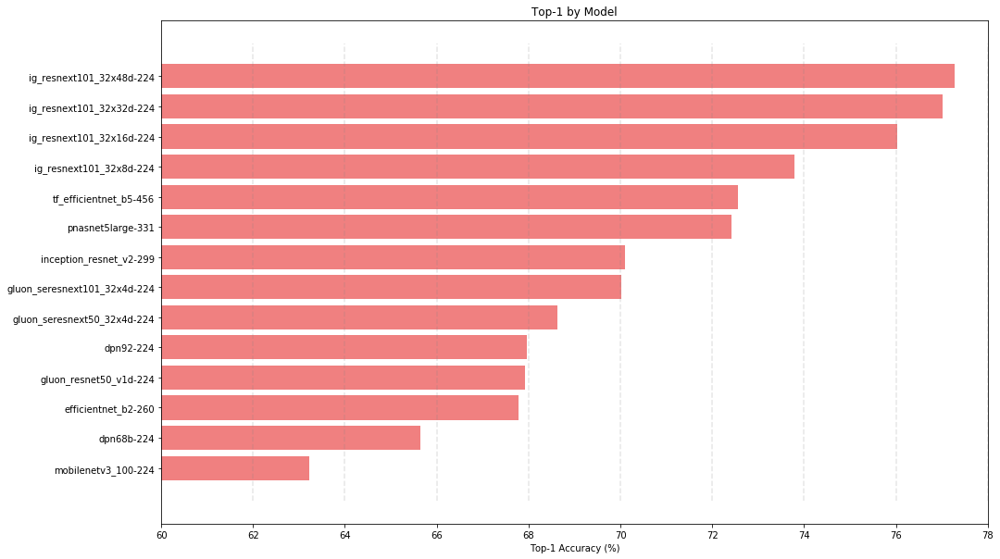

Results by top-1 accuracy:
  Model: ig_resnext101_32x48d-224       Top-1 77.28, Top-5 93.61
  Model: ig_resnext101_32x32d-224       Top-1 77.02, Top-5 93.37
  Model: ig_resnext101_32x16d-224       Top-1 76.02, Top-5 93.07
  Model: ig_resnext101_32x8d-224        Top-1 73.78, Top-5 92.26
  Model: tf_efficientnet_b5-456         Top-1 72.55, Top-5 91.10
  Model: pnasnet5large-331              Top-1 72.41, Top-5 90.25
  Model: inception_resnet_v2-299        Top-1 70.10, Top-5 88.70
  Model: gluon_seresnext101_32x4d-224   Top-1 70.01, Top-5 88.92
  Model: gluon_seresnext50_32x4d-224    Top-1 68.62, Top-5 88.34
  Model: dpn92-224                      Top-1 67.96, Top-5 87.51
  Model: gluon_resnet50_v1d-224         Top-1 67.92, Top-5 87.14
  Model: efficientnet_b2-260            Top-1 67.78, Top-5 88.21
  Model: dpn68b-224                     Top-1 65.65, Top-5 85.93
  Model: mobilenetv3_100-224            Top-1 63.22, Top-5 84.50


In [9]:
fig = plt.figure()
ax1 = fig.add_subplot(111)
ax1.barh(top1_names_sorted, top1_sorted, color='lightcoral')

ax1.set_title('Top-1 by Model')
ax1.set_xlabel('Top-1 Accuracy (%)')
ax1.set_yticklabels(top1_names_sorted)
ax1.autoscale(True, axis='both')

acc_min = top1_sorted[0]
acc_max = top1_sorted[-1]
plt.xlim([math.ceil(acc_min - .3*(acc_max - acc_min)), math.ceil(acc_max)])

plt.vlines(plt.xticks()[0], *plt.ylim(), color='0.5', alpha=0.2, linestyle='--')
plt.show()

print('Results by top-1 accuracy:')
results_by_top1 = list(sorted(results.keys(), key=lambda x: results[x]['top1'], reverse=True))
for m in results_by_top1:
  print('  Model: {:30} Top-1 {:4.2f}, Top-5 {:4.2f}'.format(m, results[m]['top1'], results[m]['top5']))

In [0]:
!wget -q https://raw.githubusercontent.com/rwightman/pytorch-image-models/master/results/results-all.csv
original_df = pd.read_csv('./results-all.csv', index_col=0)
original_results = original_df.to_dict(orient='index')

In [0]:
# helper methods for dumbbell plot
import matplotlib.lines as mlines

def label_line_horiz(ax, line, label, color='0.5', fs=14, halign='center'):
    xdata, ydata = line.get_data()
    x1, x2 = xdata
    xx = 0.5 * (x1 + x2)
    text = ax.annotate(
        label, xy=(xx, ydata[0]), xytext=(0, 1), textcoords='offset points',
        size=fs, color=color, zorder=3,
        bbox=dict(boxstyle="round", fc="w", color='0.5'),
        horizontalalignment='center',
        verticalalignment='center')
    return text

def draw_line_horiz(ax, p1, p2, label, color='black'):
    l = mlines.Line2D(*zip(p1, p2), color=color, zorder=0)
    ax.add_line(l)
    label_line(ax, l, label)
    return l

def label_line_vert(ax, line, label, color='0.5', fs=14, halign='center'):
    xdata, ydata = line.get_data()
    y1, y2 = ydata
    yy = 0.5 * (y1 + y2)
    text = ax.annotate(
        label, xy=(xdata[0], yy), xytext=(0, 0), textcoords='offset points',
        size=fs, color=color, zorder=3,
        bbox=dict(boxstyle="round", fc="w", color='0.5'),
        horizontalalignment='center',
        verticalalignment='center')
    return text

def draw_line_vert(ax, p1, p2, label, color='black'):
    l = mlines.Line2D(*zip(p1, p2), color=color, zorder=0)
    ax.add_line(l)
    label_line_vert(ax, l, label)
    return l


# Top-1 Accuracy Difference Between ImageNet-1k and ImageNet-V2

And here we are, the focal point. How does each model's ImageNet-V2 accuracy compare with its original ImageNet-1k score? 

The general trend -- with increased model capacity scores on both sets increase and the gap (generally) narrows. This matches results of the [original paper for the ImageNet-V2](https://arxiv.org/abs/1902.10811). 

Most noteably though, the WSL Instagram ResNeXt101 models are the only with performance gaps less than 10%. I've tested quite a few models on this dataset, more than in this notebook. This is the first time I've run into any models with  absolute performance this high and performance gaps this low. Impressive. I hope to explore what this means for transfer learning and adaptation of these models to other tasks.

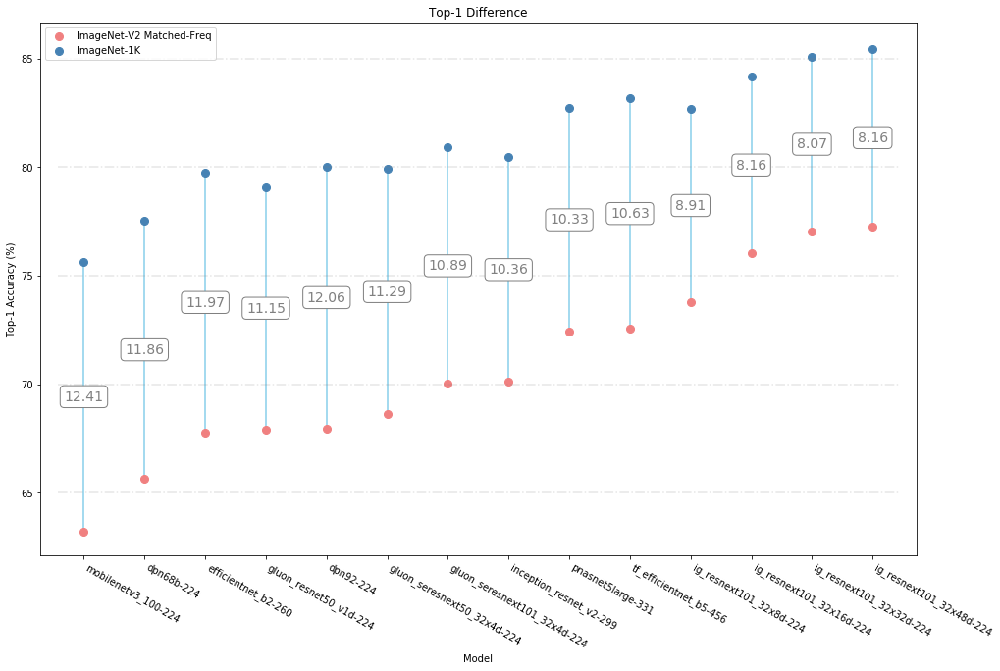

Results by absolute accuracy gap between ImageNet-Sketch and original ImageNet top-1:
  Model: ig_resnext101_32x32d-224       -8.07%
  Model: ig_resnext101_32x16d-224       -8.16%
  Model: ig_resnext101_32x48d-224       -8.16%
  Model: ig_resnext101_32x8d-224        -8.91%
  Model: pnasnet5large-331              -10.33%
  Model: inception_resnet_v2-299        -10.36%
  Model: tf_efficientnet_b5-456         -10.63%
  Model: gluon_seresnext101_32x4d-224   -10.89%
  Model: gluon_resnet50_v1d-224         -11.15%
  Model: gluon_seresnext50_32x4d-224    -11.29%
  Model: dpn68b-224                     -11.86%
  Model: efficientnet_b2-260            -11.97%
  Model: dpn92-224                      -12.06%
  Model: mobilenetv3_100-224            -12.41%

Results by relative accuracy gap between ImageNet-Sketch and original ImageNet top-1:
  Model: ig_resnext101_32x32d-224       -9.49%
  Model: ig_resnext101_32x48d-224       -9.55%
  Model: ig_resnext101_32x16d-224       -9.69%
  Model: ig_resnex

In [12]:
fig = plt.figure()
ax1 = fig.add_subplot(111)

# draw the ImageNet-V2 dots, we're sorted on this
ax1.scatter(x=top1_names_sorted, y=top1_sorted, s=64, c='lightcoral',marker="o", label='ImageNet-V2 Matched-Freq')

# draw the original ImageNet-1k validation dots
orig_top1 = [original_results[results[n]['model']]['top1'] for n in top1_names_sorted]
ax1.scatter(x=top1_names_sorted, y=orig_top1, s=64, c='steelblue', marker="o", label='ImageNet-1K')

for n, vo, vn in zip(top1_names_sorted, orig_top1, top1_sorted):
    draw_line_vert(ax1, (n, vo), (n, vn),
                   str(round(vo - vn, 2)), 'skyblue')

ax1.set_title('Top-1 Difference')
ax1.set_ylabel('Top-1 Accuracy (%)')
ax1.set_xlabel('Model')
yl, yh = ax1.get_ylim()
yl = 5 * ((yl + 1) // 5 + 1) 
yh = 5 * (yh // 5 + 1)
for y in plt.yticks()[0][1:-1]:
    ax1.axhline(y, 0.02, 0.98, c='0.5', alpha=0.2, linestyle='-.')
ax1.set_xticklabels(top1_names_sorted, rotation='-30', ha='left')
ax1.legend(loc='upper left')
plt.show()

print('Results by absolute accuracy gap between ImageNet-Sketch and original ImageNet top-1:')
gaps = {x: (results[x]['top1'] - original_results[results[x]['model']]['top1']) for x in results.keys()}
sorted_keys = list(sorted(results.keys(), key=lambda x: gaps[x], reverse=True))
for m in sorted_keys:
  print('  Model: {:30} {:4.2f}%'.format(m, gaps[m]))
print()

print('Results by relative accuracy gap between ImageNet-Sketch and original ImageNet top-1:')
gaps = {x: 100 * (results[x]['top1'] - original_results[results[x]['model']]['top1']) / original_results[results[x]['model']]['top1'] for x in results.keys()}
sorted_keys = list(sorted(results.keys(), key=lambda x: gaps[x], reverse=True))
for m in sorted_keys:
  print('  Model: {:30} {:4.2f}%'.format(m, gaps[m]))
print()

# Top-5 Accuracy Difference Between ImageNet-1k and ImageNet-V2

Top-5 differences very similar to the Top-1 above. The same overall trend and the same stand-out performance for the IG ResNeXts.

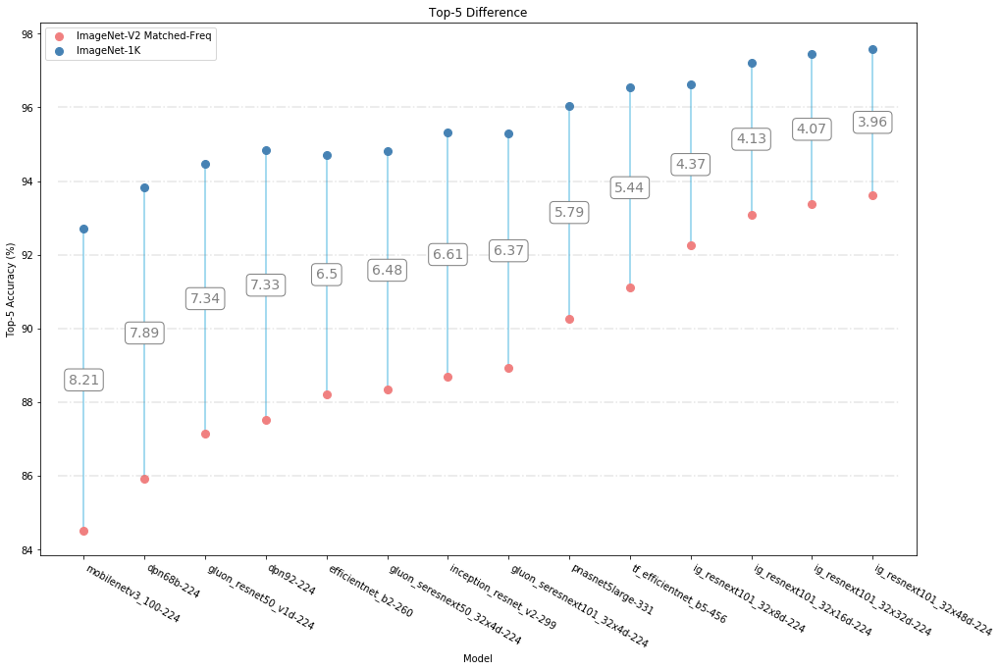

Results by relative accuracy gap between ImageNet-Sketch and original ImageNet top-5:
  Model: ig_resnext101_32x48d-224       -3.96%
  Model: ig_resnext101_32x32d-224       -4.07%
  Model: ig_resnext101_32x16d-224       -4.13%
  Model: ig_resnext101_32x8d-224        -4.37%
  Model: tf_efficientnet_b5-456         -5.44%
  Model: pnasnet5large-331              -5.79%
  Model: gluon_seresnext101_32x4d-224   -6.37%
  Model: gluon_seresnext50_32x4d-224    -6.48%
  Model: efficientnet_b2-260            -6.50%
  Model: inception_resnet_v2-299        -6.61%
  Model: dpn92-224                      -7.33%
  Model: gluon_resnet50_v1d-224         -7.34%
  Model: dpn68b-224                     -7.89%
  Model: mobilenetv3_100-224            -8.21%

Results by relative accuracy gap between ImageNet-Sketch and original ImageNet top-5:
  Model: ig_resnext101_32x48d-224       -4.06%
  Model: ig_resnext101_32x32d-224       -4.17%
  Model: ig_resnext101_32x16d-224       -4.25%
  Model: ig_resnext101_32x8d

In [13]:
fig = plt.figure()
ax1 = fig.add_subplot(111)

# draw the ImageNet-V2 top-5 dots, we're sorted on this
ax1.scatter(x=top5_names_sorted, y=top5_sorted, s=64, c='lightcoral',marker="o", label='ImageNet-V2 Matched-Freq')

# draw the original ImageNet-1k validation dots
orig_top5 = [original_results[results[n]['model']]['top5'] for n in top5_names_sorted]
ax1.scatter(x=top5_names_sorted, y=orig_top5, s=64, c='steelblue', marker="o", label='ImageNet-1K')

for n, vo, vn in zip(top5_names_sorted, orig_top5, top5_sorted):
    draw_line_vert(ax1, (n, vo), (n, vn),
                   str(round(vo - vn, 2)), 'skyblue')

ax1.set_title('Top-5 Difference')
ax1.set_ylabel('Top-5 Accuracy (%)')
ax1.set_xlabel('Model')
yl, yh = ax1.get_ylim()
yl = 5 * ((yl + 1) // 5 + 1) 
yh = 5 * (yh // 5 + 1)
for y in plt.yticks()[0][2:-2]:
    ax1.axhline(y, 0.02, 0.98, c='0.5', alpha=0.2, linestyle='-.')
ax1.set_xticklabels(top5_names_sorted, rotation='-30', ha='left')
ax1.legend(loc='upper left')
plt.show()

print('Results by relative accuracy gap between ImageNet-Sketch and original ImageNet top-5:')
gaps = {x: (results[x]['top5'] - original_results[results[x]['model']]['top5']) for x in results.keys()}
sorted_keys = list(sorted(results.keys(), key=lambda x: gaps[x], reverse=True))
for m in sorted_keys:
  print('  Model: {:30} {:4.2f}%'.format(m, gaps[m]))
print()

print('Results by relative accuracy gap between ImageNet-Sketch and original ImageNet top-5:')
gaps = {x: 100 * (results[x]['top5'] - original_results[results[x]['model']]['top5']) / original_results[results[x]['model']]['top5'] for x in results.keys()}
sorted_keys = list(sorted(results.keys(), key=lambda x: gaps[x], reverse=True))
for m in sorted_keys:
  print('  Model: {:30} {:4.2f}%'.format(m, gaps[m]))

# Best and Worst Predictions
We're going to re-run inference on one of our better models -- a ResNext101-32x16 pretrained on Instagram tags. We'll collect per-example losses and top-5 predictions and then display the results.

In [0]:
# some code to display images in a grid and ground truth vs predictions for specified indices
from torchvision.utils import make_grid
import torchvision.transforms as transforms
import matplotlib.pyplot as plt

def show_img(ax, img):
    npimg = img.numpy()
    ax.imshow(np.transpose(npimg, (1,2,0)), interpolation='bicubic')
    
def show_summary(indices, dataset, nrows):
    col_scale = len(indices) // nrows
    top5_idx = mr['top5_idx'][indices]
    top5_val = mr['top5_val'][indices]

    images = []
    labels = []
    filenames = []

    dataset.transform = transforms.Compose([
        transforms.Resize(320, Image.BICUBIC),
        transforms.CenterCrop(320),
        transforms.ToTensor()])

    for i in indices:
        img, label = dataset[i]
        images.append(img)
        labels.append(label)
    filenames = dataset.filenames(list(indices), basename=True)

    fig = plt.figure(figsize=(10, 10 * col_scale), dpi=100)
    ax = fig.add_subplot('111')
    grid_best = make_grid(images, nrow=nrows, padding=10, normalize=True, scale_each=True)
    show_img(ax, grid_best)
    plt.show()

    for i, l in enumerate(labels):
        print('{} ground truth = {}'.format(
            id_to_synset[i] + '/' + filenames[i], id_to_text[l]))
        print('Predicted:')
        for pi, pv in zip(top5_idx[i], top5_val[i]):
            if pv > 2e-5:
                print('  {:.3f} {}'.format(100*pv, id_to_text[pi]))
        print()

In [0]:
# create mappings of label id to text and synset
!wget -q https://raw.githubusercontent.com/HoldenCaulfieldRye/caffe/master/data/ilsvrc12/synset_words.txt
with open('./synset_words.txt', 'r') as f:
    split_lines = [l.strip().split(' ') for l in f.readlines()]
    id_to_synset = dict(enumerate([l[0] for l in split_lines]))
    id_to_text = dict(enumerate([' '.join(l[1:]) for l in split_lines]))

In [16]:
BATCH_SIZE=128
mk, mr = runner(dict(model='ig_resnext101_32x32d'), dataset, device, collect_loss=True)    

Downloading: "https://download.pytorch.org/models/ig_resnext101_32x32-e4b90b00.pth" to /root/.cache/torch/checkpoints/ig_resnext101_32x32-e4b90b00.pth
100%|██████████| 1876573776/1876573776 [01:41<00:00, 18563785.10it/s]
Data processing configuration for current model + dataset:
	input_size: (3, 224, 224)
	interpolation: bilinear
	mean: (0.485, 0.456, 0.406)
	std: (0.229, 0.224, 0.225)
	crop_pct: 0.875


Test: [0/79]	Time 4.914 (4.914, 26.048/s) 	Prec@1 86.719 (86.719)	Prec@5 99.219 (99.219)
Test: [20/79]	Time 3.224 (3.202, 39.978/s) 	Prec@1 77.344 (81.436)	Prec@5 94.531 (95.238)
Test: [40/79]	Time 3.365 (3.246, 39.431/s) 	Prec@1 68.750 (80.526)	Prec@5 89.844 (94.684)
Test: [60/79]	Time 3.475 (3.309, 38.680/s) 	Prec@1 79.688 (78.279)	Prec@5 91.406 (93.686)
 * Prec@1 77.020 (22.980) Prec@5 93.340 (6.660)


# The Best Predictions
Harmonicas and Carbonara

In [17]:
nrows = 2
num_images = 10
best_idx = np.argsort(mr['losses_val'])[:num_images]
show_summary(best_idx, dataset, nrows)

n01440764/7.jpeg ground truth = burrito
Predicted:
  100.000 burrito

n01443537/1.jpeg ground truth = carbonara
Predicted:
  100.000 carbonara

n01484850/2.jpeg ground truth = carbonara
Predicted:
  100.000 carbonara

n01491361/8.jpeg ground truth = washer, automatic washer, washing machine
Predicted:
  100.000 washer, automatic washer, washing machine

n01494475/6.jpeg ground truth = rugby ball
Predicted:
  100.000 rugby ball

n01496331/3.jpeg ground truth = harmonica, mouth organ, harp, mouth harp
Predicted:
  100.000 harmonica, mouth organ, harp, mouth harp

n01498041/8.jpeg ground truth = frilled lizard, Chlamydosaurus kingi
Predicted:
  100.000 frilled lizard, Chlamydosaurus kingi

n01514668/4.jpeg ground truth = lens cap, lens cover
Predicted:
  100.000 lens cap, lens cover

n01514859/0.jpeg ground truth = bobsled, bobsleigh, bob
Predicted:
  100.000 bobsled, bobsleigh, bob

n01518878/5.jpeg ground truth = harmonica, mouth organ, harp, mouth harp
Predicted:
  100.000 harmonica, m

# The Worst Predictions
As usual, the worst predicitions are hard,  in most cases due to issues with labelling or really challenging images. But hey, some of them are amusing. Who wouldn't want a pirate guinea pig? Pretty sure that's a marmot, not a beaver...

In [18]:
nrows = 2
num_images = 20
worst_idx = np.argsort(mr['losses_val'])[-num_images:][::-1]
show_summary(worst_idx, dataset, nrows)

n01440764/2.jpeg ground truth = bulbul
Predicted:
  100.000 mousetrap

n01443537/6.jpeg ground truth = sarong
Predicted:
  100.000 crutch

n01484850/4.jpeg ground truth = guinea pig, Cavia cobaya
Predicted:
  100.000 pirate, pirate ship

n01491361/9.jpeg ground truth = beaver
Predicted:
  100.000 robin, American robin, Turdus migratorius

n01494475/7.jpeg ground truth = doormat, welcome mat
Predicted:
  100.000 hay

n01496331/6.jpeg ground truth = marmoset
Predicted:
  100.000 jackfruit, jak, jack

n01498041/6.jpeg ground truth = goblet
Predicted:
  100.000 hip, rose hip, rosehip

n01514668/5.jpeg ground truth = handkerchief, hankie, hanky, hankey
Predicted:
  100.000 rocking chair, rocker

n01514859/8.jpeg ground truth = dial telephone, dial phone
Predicted:
  100.000 sewing machine

n01518878/7.jpeg ground truth = hot pot, hotpot
Predicted:
  99.658 corn
  0.332 ear, spike, capitulum
  0.011 cucumber, cuke

n01530575/3.jpeg ground truth = binder, ring-binder
Predicted:
  99.463 ashca

# The Worst Predictions with Test Time Pooling

Looking at the worst predictions above, there are a number of examples where the label for the image was for smaller, less obvious objects at the periphery of the scene (ie syringe at very edge of stethoscope, or trumpet being much less prominent than the accordion ). Seeing this I decided to run it again at a higher resolution, with Test Time Pooling enabled and a 100% crop. This results in a little over 1% boost in top-1 and top-5 and yes, those mentioned examples are no longer among the worst.

In [19]:
# only doing this one if we're on a T4
if HAS_T4:
    mk, mr = runner(dict(model='ig_resnext101_32x32d', img_size=288, ttp=True), dataset, device, collect_loss=True)
    nrows = 2
    num_images = 20
    worst_idx = np.argsort(mr['losses_val'])[-num_images:][::-1]
    show_summary(worst_idx, dataset, nrows)

Downloading: "https://download.pytorch.org/models/ig_resnext101_32x32-e4b90b00.pth" to /root/.cache/torch/checkpoints/ig_resnext101_32x32-e4b90b00.pth
100%|██████████| 1876573776/1876573776 [01:35<00:00, 19579360.70it/s]
Applying test time pooling to model
Data processing configuration for current model + dataset:
	input_size: (3, 288, 288)
	interpolation: bicubic
	mean: (0.485, 0.456, 0.406)
	std: (0.229, 0.224, 0.225)
	crop_pct: 0.875


Test: [0/79]	Time 36.513 (36.513, 3.506/s) 	Prec@1 87.500 (87.500)	Prec@5 100.000 (100.000)
Test: [20/79]	Time 5.699 (6.974, 18.353/s) 	Prec@1 79.688 (82.329)	Prec@5 96.094 (95.945)
Test: [40/79]	Time 5.764 (6.389, 20.033/s) 	Prec@1 70.312 (81.326)	Prec@5 90.625 (95.312)
Test: [60/79]	Time 5.792 (6.186, 20.694/s) 	Prec@1 81.250 (79.188)	Prec@5 95.312 (94.365)
 * Prec@1 78.100 (21.900) Prec@5 94.100 (5.900)


n01440764/2.jpeg ground truth = bulbul
Predicted:
  100.000 mousetrap

n01443537/6.jpeg ground truth = sarong
Predicted:
  100.000 crutch

n01484850/2.jpeg ground truth = pot, flowerpot
Predicted:
  100.000 Polaroid camera, Polaroid Land camera

n01491361/7.jpeg ground truth = hot pot, hotpot
Predicted:
  99.902 corn
  0.100 ear, spike, capitulum

n01494475/6.jpeg ground truth = jersey, T-shirt, tee shirt
Predicted:
  100.000 park bench

n01496331/6.jpeg ground truth = goblet
Predicted:
  100.000 hip, rose hip, rosehip

n01498041/6.jpeg ground truth = marmoset
Predicted:
  100.000 jackfruit, jak, jack

n01514668/7.jpeg ground truth = custard apple
Predicted:
  100.000 ant, emmet, pismire

n01514859/7.jpeg ground truth = corn
Predicted:
  100.000 hotdog, hot dog, red hot

n01518878/5.jpeg ground truth = sarong
Predicted:
  100.000 umbrella

n01530575/3.jpeg ground truth = wool, woolen, woollen
Predicted:
  100.000 doormat, welcome mat

n01531178/9.jpeg ground truth = groom, bridegroom
P